# Data Science Project - Group 5 (Goldman Grinders)

## Introduction

In the following, we import data from the Federal Reserve Bank of st. Louis.
Importing tables from the FRED source, we have chosen 10-Year Treasury Constant Maturity Rate (DGS1), 10-Year Treasury Constant Maturity Rate (DGS10) and Wilshire 5000 Full Cap Price Index (Will5000prfc) where all the timeseries end in 25th of March 2020. Note the different starttime, this will be corrected for in the code later.

First, we import the data, manipulating and cleaning it.
Second, we analyze the time-series.
Thridly, we extrapolate the stock data by Monte-Carlo simulation.



In [1]:
#importing various packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import ipywidgets as widgets
from ipywidgets import interact
from matplotlib_venn import venn2 #install with: pip install matplotlib-venn
import pandas_datareader #install with: pip install pandas-datareader
import pydst #install with: pip install git+https://github.com/elben10/pydst`
import datetime
import math
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches

# autoreload modules when code is run
%load_ext autoreload
%autoreload 2
 
# local modules

In [30]:
#Setting times:
start = datetime.datetime(1950,1,1)
end = datetime.datetime(2020,4,30)


#Loading data for stock index, two interest rates for rate spread:
stocks = pandas_datareader.data.DataReader('WILL5000PRFC','fred',start,end)
dgs1 = pandas_datareader.data.DataReader('dgs1','fred',start,end)
dgs10 = pandas_datareader.data.DataReader('dgs10','fred',start,end)

#Renaming stocks-column for easier retreival:
stocks.rename(columns={'WILL5000PRFC':'stocks'},inplace=True)

#Interpolating stock variable to fill-out day values
stocks.interpolate(limit=30, inplace=True)

#Merging data into single dataframe:
mellemregning = pd.merge(stocks,dgs1,how='inner',left_index=True,right_index=True)
data = pd.merge(mellemregning,dgs10,how='inner',left_index=True,right_index=True)

#Deleting NaN:
data.dropna(inplace=True)

#Defining spread:
data['spread'] = data['dgs10']-data['dgs1']
data['logstocks'] = [
    math.log(i)
    for i in data['stocks']
]

#Creating moving averages:
data['stocks_mvavg'] = data['logstocks'].rolling(window=1000,center=True).mean()
data['dgs10_mvavg'] = data['dgs10'].rolling(window=1000, center=True).mean()
data['dgs1_mvavg'] = data['dgs1'].rolling(window=1000, center=True).mean()
data['spread_mvavg'] = data['spread'].rolling(window=1000, center=True).mean()

data

,stocks,dgs1,dgs10,spread,logstocks,stocks_mvavg,dgs10_mvavg,dgs1_mvavg,spread_mvavg
DATE,,,,,,,,,
1970-12-31,830.270000,4.94,6.50,1.56,6.721751,NaN,NaN,NaN,NaN
1971-01-04,834.369048,4.92,6.46,1.54,6.726676,NaN,NaN,NaN,NaN
1971-01-05,836.418571,4.95,6.47,1.52,6.729129,NaN,NaN,NaN,NaN
1971-01-06,838.468095,5.03,6.47,1.44,6.731577,NaN,NaN,NaN,NaN
1971-01-07,840.517619,5.00,6.45,1.45,6.734018,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...
2020-04-24,28483.890000,0.18,0.60,0.42,10.257094,NaN,NaN,NaN,NaN
2020-04-27,28990.170000,0.17,0.67,0.50,10.274712,NaN,NaN,NaN,NaN
2020-04-28,28876.230000,0.16,0.62,0.46,10.270774,NaN,NaN,NaN,NaN


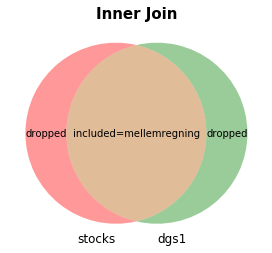

In [31]:
#Plotting a venn-digram of the merging method for "mellemregning"
plt.figure()
v = venn2(subsets = (4, 4, 10), set_labels = ('stocks', 'dgs1'))
v.get_label_by_id('100').set_text('dropped')
v.get_label_by_id('010').set_text('dropped')
v.get_label_by_id('110').set_text('included=mellemregning')
plt.title('Inner Join', weight='bold',fontsize=15)
plt.show()

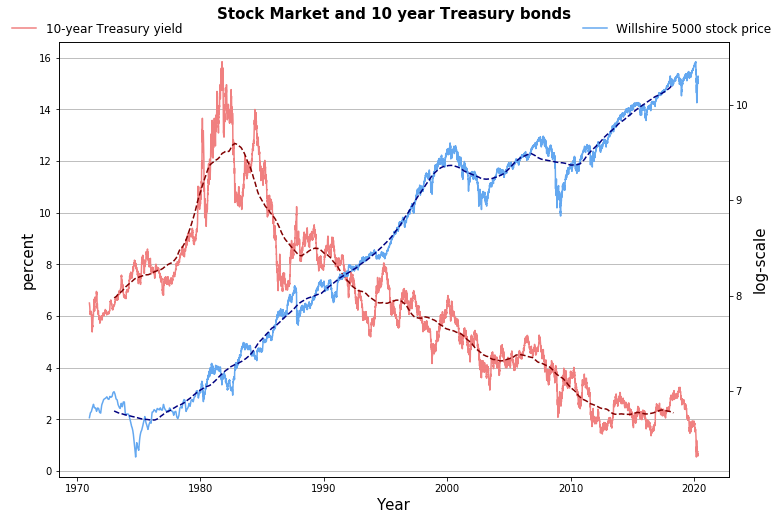

In [32]:
#Plotting with 500 day simple moving average:
fig, ax1 = plt.subplots(figsize=(12,8))
plt.title('Stock Market and 10 year Treasury bonds',fontsize=15,weight='bold',pad=23)
plt.xlabel('Year',fontsize=15)

ax1.plot(data['dgs10'], label='10-year Treasury yield',c='lightcoral')
ax1.plot(data['dgs10_mvavg'],c='maroon',linestyle='--',label='__no_legend__')
ax1.grid(axis='y')
plt.ylabel('percent',fontsize=15)
plt.legend(frameon=False,bbox_to_anchor=(0.2,1.07),fontsize=12)

ax2 = ax1.twinx()
goldman_blue = '#64a8f0'
ax2.plot(data['logstocks'], label='Willshire 5000 stock price',c=goldman_blue)
ax2.plot(data['stocks_mvavg'],c='navy',linestyle='--',label='__no_legend__')
plt.ylabel('log-scale',fontsize=15)
plt.legend(frameon=False,bbox_to_anchor=(1.08,1.07),fontsize=12)
plt.savefig('Stocks vs Bonds.pdf')

In [12]:
#Constructing alternative plotting function, which is then used to make the plot interactive
goldman_blue = '#64a8f0'   

def _new_plotting(df1,x,years):
    
    df1['Year']=[int(str(i).split('-')[0]) for i in df1.index.values]
    start=years[0]
    end=years[1]
    df1=df1.loc[(df1['Year']>=start) & (df1['Year']<=end)]
    
    fig1, ax1=plt.subplots(figsize=(12,8))
    ax1.set_xlabel('Year')
    ax1.grid(axis='y')
    

    if x == 'dgs10':
        ax1.set_title('10Y Treasury and Wiltshire 5000',fontsize=15,weight='bold',pad=23)
        ax1.plot(df1['dgs10'],label='10Y Treasury',c='lightcoral')
        ax1.plot(df1['dgs10_mvavg'],c='maroon',linestyle='--',label='__no_legend__')
        ax1.set_ylabel('Yield (%)',fontsize=12)
        plt.legend(frameon=False,bbox_to_anchor=(0.2,1.07),fontsize=12)
        
        ax2 = ax1.twinx()
        ax2.set_ylabel('Log price',fontsize=12)
        ax2.plot(df1['logstocks'],label='Wiltshire 5000 (right axis)',c=goldman_blue)
        ax2.plot(df1['stocks_mvavg'],c='navy',linestyle='--',label='__no_legend__')
        plt.legend(frameon=False,bbox_to_anchor=(1.08,1.07),fontsize=12)
        
    elif x == 'dgs1':
        ax1.set_title('1Y Treasury and Wiltshire 5000',fontsize=15,weight='bold',pad=23)
        ax1.plot(df1['dgs1'],label='1Y Treasury',c='lightcoral')
        ax1.plot(df1['dgs1_mvavg'],c='maroon',linestyle='--',label='__no_legend__')
        ax1.set_ylabel('Yield (%)',fontsize=12)
        plt.legend(frameon=False,bbox_to_anchor=(0.2,1.07),fontsize=12)
        
        ax2 = ax1.twinx()
        ax2.set_ylabel('Log price',fontsize=12)
        ax2.plot(df1['logstocks'],label='Wiltshire 5000 (right axis)',c=goldman_blue)
        ax2.plot(df1['stocks_mvavg'],c='navy',linestyle='--',label='__no_legend__')
        plt.legend(frameon=False,bbox_to_anchor=(1.08,1.07),fontsize=12)
        
    elif x == 'spread':
        ax1.set_title('10Y-1Y Yield Spread and Wiltshire 5000',fontsize=15,weight='bold',pad=23)
        ax1.set_ylabel('Yield (%)',fontsize=12)
        ax1.plot(df1['spread'],label='10Y-1Y Spread',c='lightcoral')
        ax1.plot(df1['spread_mvavg'],c='maroon',linestyle='--',label='__no_legend__')
        plt.legend(frameon=False,bbox_to_anchor=(0.2,1.07),fontsize=12)
        
        ax2 = ax1.twinx()
        ax2.set_ylabel('Log price',fontsize=12)
        ax2.plot(df1['logstocks'],label='Wiltshire 5000 (right axis)',c=goldman_blue)
        ax2.plot(df1['stocks_mvavg'],c='navy',linestyle='--',label='__no_legend__')
        plt.legend(frameon=False,bbox_to_anchor=(1.08,1.07),fontsize=12)
        
    elif x == 'dgs10 v dgs1':
        ax1.set_title('1Y and 10Y Treasury',fontsize=15,weight='bold',pad=23)
        ax1.set_ylabel('Yield (%)',fontsize=12)
        ax1.plot(df1['dgs10'],label='10Y Treasury',c='lightcoral')
        ax1.plot(df1['dgs10_mvavg'],c='maroon',linestyle='--',label='__no_legend__')
        plt.legend(frameon=False,bbox_to_anchor=(0.2,1.07),fontsize=12)
        
        ax1.plot(df1['dgs1'],label='1Y Treasury',c=goldman_blue)
        ax1.plot(df1['dgs1_mvavg'],c='navy',linestyle='--',label='__no_legend__')
        plt.legend(frameon=False,bbox_to_anchor=(0.2,1.1),fontsize=12)
        
    plt.show()

In [13]:
#Making the interactive plot
def new_plotting(df1):

    widgets.interact(_new_plotting,
        df1=widgets.fixed(df1),
        x=[('1Y Treasury and Wiltshire 5000','dgs1'),
           ('10Y Treasury and Wiltshire 5000','dgs10'),
           ('10Y-1Y Spread and Wiltshire 5000','spread'),
           ('1Y and 10Y Treasury','dgs10 v dgs1')], 
        years=widgets.IntRangeSlider(
        description="Year",
        min=1970,
        max=2020,
        value=[1970,2020],
        continuous_update=False)                
    )

In [14]:
new_plotting(df1=data) 

interactive(children=(Dropdown(description='x', options=(('1Y Treasury and Wiltshire 5000', 'dgs1'), ('10Y Tre…

In the following section we estimate the daily percentage growth in the 10-year Treasury bond and thereafter we plot it for the entire period.  

In [16]:
#making a new dataset by copying existing
growth_data=data.copy()
#calculate rolling yearly pct. change
growth_data['growth']=growth_data['dgs10'].pct_change(periods=365,fill_method='ffill',freq='D')
#delete empty values
growth_data.dropna(inplace=True)

growth_data.head(10)

,stocks,dgs1,dgs10,spread,logstocks,stocks_mvavg,dgs10_mvavg,dgs1_mvavg,spread_mvavg,Year,growth
DATE,,,,,,,,,,,
1981-06-30,1391.40,14.87,13.86,-1.01,7.238066,7.130336,11.88890,11.84912,0.03978,1981,0.373637
1981-07-01,1378.08,15.20,14.04,-1.16,7.228447,7.131105,11.89336,11.85388,0.03948,1981,0.385982
1981-07-02,1366.40,15.10,13.95,-1.15,7.219935,7.131830,11.89820,11.85932,0.03888,1981,0.368989
1981-07-07,1357.34,15.31,14.04,-1.27,7.213282,7.133196,11.90890,11.87170,0.03720,1981,0.376471
1981-07-08,1359.29,15.32,14.11,-1.21,7.214718,7.133824,11.91411,11.87713,0.03698,1981,0.398414
1981-07-09,1367.44,15.62,14.12,-1.50,7.220696,7.134488,11.91906,11.88229,0.03677,1981,0.392505
1981-07-10,1369.17,15.18,13.94,-1.24,7.221960,7.135154,11.92364,11.88621,0.03743,1981,0.365328
1981-07-14,1367.18,15.42,14.15,-1.27,7.220506,7.136498,11.93333,11.89532,0.03801,1981,0.369797
1981-07-15,1377.22,15.35,14.07,-1.28,7.227822,7.137160,11.93871,11.90031,0.03840,1981,0.383481


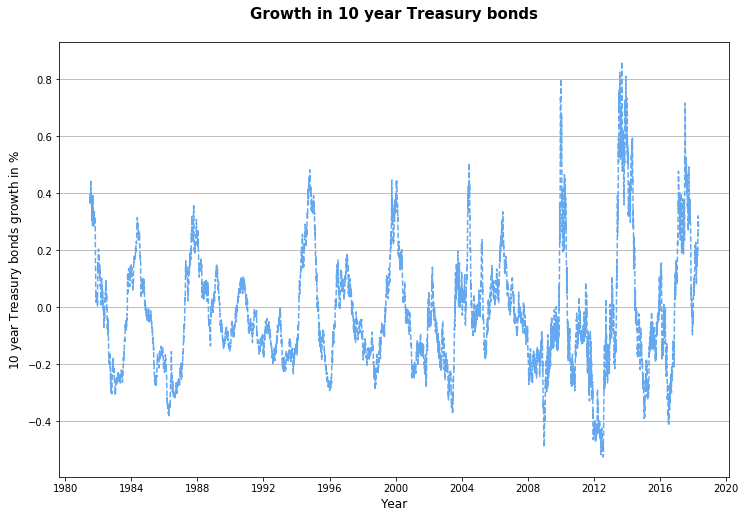

In [17]:
#plotting the growth rate
fig, ax1 = plt.subplots(figsize=(12,8))
plt.title('Growth in 10 year Treasury bonds',fontsize=15,weight='bold',pad=23)
plt.xlabel('Year',fontsize=12)

ax1.plot(growth_data['growth'],c=goldman_blue,linestyle='--')
ax1.grid(axis='y')
ax1.set_ylabel('10 year Treasury bonds growth in $\%$',fontsize=12)
plt.show()

From the graph we overall conclude higher volatility in the 10-year Treasury bond over the period though fluctuating around a rather stable mean. We see a significant fall in the bond from 2019 to 2020. 

In [18]:
#Estimating covariance-matrix between stocks and 1-year Treasury yield
Covariance=np.cov(data['stocks'],y=data['dgs1'])
print(Covariance)

[[ 6.30888791e+07 -2.11071057e+04]
 [-2.11071057e+04  1.44895414e+01]]


The diagonal of the covariance matrix illustrates first of all the variance of the Willshire 5000 (6.3) and the 1-year Treasury yield (1.44). The fact that the spread is bigger of the Willshire 5000 is consistent with our expectations. More interesting we can from the inverse diagonal see that the Willshire 5000 and the 1-year Treasury yield move inversely with a negative covariance, thus they are negatively correlated, but remember nothing can be said about the direction of causality. 

# Forecasting

We want to extrapolate the stock-data by the model:
$$ y_{t+1} = y_{t} + \tilde{s}, \hspace{10mm} s \sim N(\delta_1,\sigma^2)$$

Where $y_t$ is the stock-price in period $t$, $\delta_1$ is the slope parameter of the stock price regressed on time, and $\tilde{s} \sim N(\delta_1,\sigma^2)$ is a period-wise chock having the expected value of $\delta_1$, and variance of the daily price change.

Note, that:
$$ \tilde{s} = 0 \hspace{5mm} for \hspace{5mm} t \in [0;sup(t)]$$
$$ \tilde{s} \sim N(\delta_1,\sigma^2) \hspace{5mm} for \hspace{5mm} t \in ]sup(t);\infty[ $$

That is, the chock is not included in our data until we extrapolate the time series.

First, we seek to estimate $\delta_1$ by OLS. Second, we estimate $\sigma^2$ as the variance in the daily change in the stock price Third, we estimate the model mentioned above. At last, we graph our findings.

In [19]:
import statsmodels.api as sm

#Appending time-series to data:
data['t'] = range(0,len(data['logstocks']))

#Then, regressing (stock price without log):
X = sm.add_constant(data['t'])
model = sm.OLS(data['stocks'],X)
results = model.fit()
results.params
print(results.summary())

#We find delta_1 to be 2,5
const = -2605.9
delta_1 = 2.5

OLS Regression Results                            
Dep. Variable:                 stocks   R-squared:                       0.859
Model:                            OLS   Adj. R-squared:                  0.859
Method:                 Least Squares   F-statistic:                 6.233e+04
Date:                Sat, 16 May 2020   Prob (F-statistic):               0.00
Time:                        17:10:52   Log-Likelihood:                -96064.
No. Observations:               10200   AIC:                         1.921e+05
Df Residuals:                   10198   BIC:                         1.921e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const      -2605.8755     58.979    -44.183      0.000   -2721.486   -2490.265
t

In [33]:
#We start out by finding an estimate of the variance in daily price change, to be used for the daily chock.
data['dailychange'] = [
    data['stocks'][i]-data['stocks'][i-1]
    for i in range(0,len(data['stocks']))
]
data.loc['1970-12-31',['dailychange']] = 0
data['dailychange'].describe()

sigma = 147.81
# We find and define the standard deviation for use in the forecast.

In [34]:
#FORECAST:
np.random.seed(58008)
simulationlength = 2000
simulationiterations = 300
lastdate = data['stocks'].index[-1]

#We start extrapolating, by starting at the last known stock-price, thereafter adding the chock-value to this, having an expected value of the estimated change in stock-price per period (day).
#This is baseline code for extrapolations:
Extra = [data['stocks'][-1]]
for i in range(0,simulationlength):
    s = np.random.normal(loc=delta_1,scale=sigma)
    Extra.append(Extra[-1]+s)
Forecast = pd.DataFrame(Extra,index=pd.date_range(start=lastdate,periods=simulationlength+1,freq='2D'),columns=['extrapolation'])


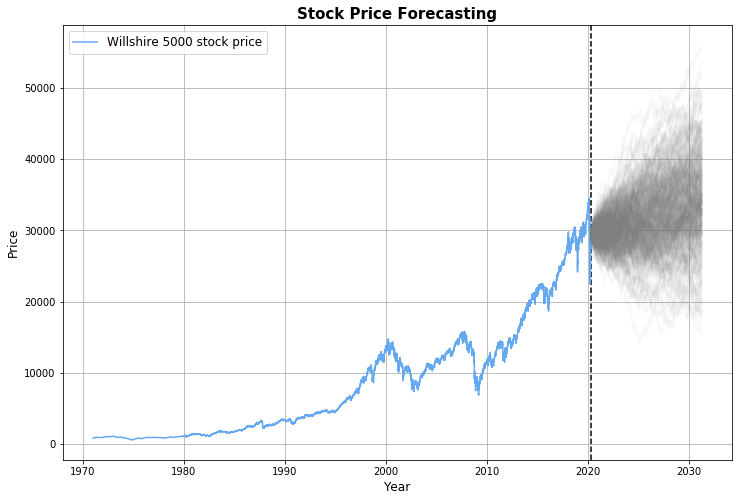

In [35]:
#Creating the figure:
fig, ax1 = plt.subplots(figsize=(12,8))
ax1.xaxis.grid(True, which='major')
ax1.xaxis.grid(True, which='minor')
ax1.yaxis.grid(True)
plt.title('Stock Price Forecasting', fontsize=15,weight='bold')
ax1.axvline(pd.datetime(2020,4,29),linestyle='--',c='black')

ax1.plot(data['stocks'],c=goldman_blue, label='Willshire 5000 stock price')
plt.legend(fontsize=12)
plt.xlabel('Year', fontsize=12)
plt.ylabel('Price', fontsize=12)


for j in range(0,simulationiterations): #Many Extrapolations, run as a for-loop:
    Extra2 = [data['stocks'][-1]]
    for i in range(0,simulationlength):
        s = np.random.normal(loc=delta_1,scale=sigma)
        Extra2.append(Extra2[-1]+s)
    ax1.plot(Forecast.index.values,Extra2,label='Forecast',c='grey',alpha=0.05)
    Extra2 = None
